# Практическая работа №1

## 1. Первичная обработка изображения и наложение помех

Для того, чтобы результат(изображение) открывался сразу в Jupyter'e, использовались такие функции, как _plt.imshow()_, _plt.show()_ и _plt.axis('off')_ (для сокрытия рамок) 

Генерация шумов, как видно ниже, произведена случайным образом

In [645]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import random
import math

def show_image(image):
    '''
    Outputs the original image as a grayscale
    
            parameters:
                    image (int[[]]): The original image is in the form of an array with values of intensity grayscale pixels
            return value:
                    None
    '''
    plt.figure(figsize=(30, 30))
    plt.imshow(image, cmap = 'gray')
    plt.axis('off')
    plt.show()    
   
def salt_and_pepper(image):
    '''
    Randomly generates "salt and pepper" type noises on the submitted image
    
            parameters:
                    image (int[[]]): The original image is in the form of an array with values of intensity grayscale pixels
            return value:
                    image (int[[]]): Image with applied noise
    '''
    row, column = image.shape
    number = random.randint(0, row * column / 10)
    
    for i in range(number):
        x_pixel = random.randint(0, row - 1)
        y_pixel = random.randint(0, column - 1)
        if ((x_pixel + y_pixel) % 2 == 0):
            image[x_pixel][y_pixel] = 255
        else:
            image[x_pixel][y_pixel] = 0
    
    return image


def impulse_noise(image):
    '''
    Randomly generates "pulse noise" type noises on the submitted image
    
            parameters:
                    image (int[[]]): The original image is in the form of an array with values of intensity grayscale pixels
            return value:
                    image (int[[]]): Image with applied noise
    '''
    row, column = image.shape
    number = random.randint(0, row * column / 100)
    
    for i in range(number):
        x_pixel = random.randint(0, row - 1)
        y_pixel = random.randint(0, column - 1)
        image[x_pixel][y_pixel] = 255
            
    return image

## 2. Фильтры

### Вспомогательные функции

In [648]:
def zeros(row, column):
    '''
    Generates a nested list of size (row, column) filled with zeros
    
            parameters:
                    row (int): The size of the first dimension
                    column (int): The size of the second dimension
            return value:
                    zeros_arr (int[[]]): Nested array filled with zeros 
    '''     
    zeros_arr = [[0] * column for i in range(row)] 
    return zeros_arr 

def bubble_sort(array):
    '''
    Sorts the submitted array using the bubble method
    
            parameters:
                    array (float[]): Source array
            return value:
                    array (float[]): Sorted source array
    ''' 
    size = len(array)
    for i in range(size - 1):
        for j in range(size - i - 1):
            if (array[j] > array[j + 1]):
                temp = array[j]
                array[j] = array[j + 1]
                array[j + 1] = temp
    
    return array
    
def matrix_to_array(matrix):
    '''
    Converts a custom matrix into a one-dimensional list
    
            parameters:
                    matrix (float[[]]): The original matrix
            return value:
                    result_array (float[]): The list obtained from the submitted matrix
    ''' 
    result_array = []
    for i in range(len(matrix)):
        for j in range(len(matrix[0])):
            result_array.append(matrix[i][j])
            
    return result_array

def median(sorted_array):
    '''
    Selects the median value from the pre-sorted list
    
            parameters:
                    sorted_array (float[]): The original pre-sorted list
            return value:
                    median (float[[]]): The resulting median value of the original list
    ''' 
    return sorted_array[len(sorted_array) // 2]

def create_border(image, border_size):
    '''
   Imposes on the submitted image a frame in the form of copied pixels of the extreme elements of the image
    
            parameters:
                    image (int[[]]): the original image is in the form of an array with values of intensity grayscale pixels
                    border_size (int): The width of the received frames
            return value:
                    result (int[[]]): Image with the resulting frames
    ''' 
    result = zeros(len(image) + 2 * border_size, len(image[0]) + 2 * border_size)
    for i in range(len(image)):
        for j in range(len(image[0])):
            result[i + border_size][j + border_size] = image[i][j]
    
    for i in range(len(image)):
        for j in range(len(image[0])):
            if (j < border_size):
                result[i][j] = result[i + border_size][j + border_size]
            else:
                break
    
    for i in range(len(image)):
        for j in range(len(image[0])):
            if (i < border_size):
                result[i][j] = result[i + border_size][j + border_size]
            else:
                break
                
    for i in range(len(result)):
        for j in range(len(result[0]), 0, -1):
            if (len(result[0]) - j < border_size):
                result[i][j - 1] = result[i][j - border_size - 1]
            else:
                break
                
    for i in range(len(result), 0, -1):
        for j in range(len(result[0])):
            if (len(result) - i < border_size):
                result[i - 1][j] = result[i - border_size - 1][j]
            else:
                break
                
    return result

def blur_kernel(filter_size):
    '''
    Procedurally generates the core of the blur effect matrix according to a predefined pattern
    
            parameters:
                    filter_size (int[]): The size of the generated core of the blur effect matrix
            return value:
                    blur_matrix (int[[]]): The generated blur effect matrix
    '''     
    blur_matrix = [[1 / (filter_size * filter_size)] * filter_size for i in range(filter_size)]
    return blur_matrix

def elem_multiply(part_matrix, kernel):
    '''
    Implements piecemeal (not classical) multiplication of two matrices of arbitrary size
    
            parameters:
                    part_matrix (int[[]]): 
                    image (int[[]]): The part of the original image expressed by the matrix
            return value:
                    image (int[[]]): The second matrix (in our case, the core of the superimposed effect)
    '''     
    result = 0
    for i in range(len(part_matrix)):
        for j in range(len(part_matrix[0])):
            result += kernel[i][j] * part_matrix[i][j]
            
    result = min(255, max(0, result))
    return int(result)

def sharpness_kernel(filter_size):
    '''
    Procedurally generates the core of the sharpness effect matrix according to a predefined pattern
    
            parameters:
                    filter_size (int[]): The size of the generated core of the blur effect matrix
            return value:
                    blur_matrix (int[[]]): The generated blur effect matrix
    ''' 
    matrix = [[-1] * filter_size for i in range(filter_size)]    
    matrix[i // 2][j // 2] = filter_size * filter_size
    
    return matrix

In [649]:
def median_filter(image, filter_size):
    '''
    Median filter implementation based on a pre-known algorithm with median value selection
    
            parameters:
                    filter_size (int): The size of the core matrix of the considered effect
                    image (int[[]]): The original image is in the form of an array with values of intensity grayscale pixels
            return value:
                    result_image (int[[]]): The image is the result of applying a median filter to this image
    '''
    row = len(image)
    column = len(image[0])
    if (row < filter_size or column < filter_size):
        print("Фильтр не может быть применен!")
        return image
    
    else:    
        expansion = filter_size // 2
        result_image = zeros(row + filter_size - 1, column + filter_size - 1)
        expanded = create_border(image, expansion * 2)

        for i in range(len(expanded) - filter_size + 1):
            for j in range(len(expanded[0]) - filter_size + 1):
                current_matrix = []
                for k in range(filter_size):
                    current_matrix.append(expanded[k + i][j : j + filter_size])

                current_array = matrix_to_array(current_matrix)
                current_array = bubble_sort(current_array)
                result_image[i][j] = median(current_array)
        
    return result_image
    

def blur_filter(image, filter_size):
    '''
    Blur filter implemented on the basis of a previously known algorithm for generating the effect core
    
            parameters:
                    filter_size (int): The size of the core matrix of the considered effect
                    image (int[[]]): The original image is in the form of an array with values of intensity grayscale pixels
            return value:
                    result_image (int[[]]): The image is the result of applying a blur a filter to this image
    '''
    row = len(image)
    column = len(image[0])
    if (row < filter_size or column < filter_size):
        print("Фильтр не может быть применен!")
        return image
    
    else: 
        expansion = filter_size // 2
        kernel = blur_kernel(filter_size)
        result_image = zeros(row + filter_size - 1, column + filter_size - 1)
        expanded = create_border(image, expansion * 2)

        for i in range(len(expanded) - filter_size + 1):
            for j in range(len(expanded[0]) - filter_size + 1):
                current_matrix = []
                for k in range(filter_size):
                    current_matrix.append(expanded[k + i][j : j + filter_size])

                result_image[i][j] = elem_multiply(kernel, current_matrix)
            
    return result_image


def sharpness_filter(image, filter_size):
    '''
    Sharpness filter implemented on the basis of a previously known algorithm for generating the effect core
    
            parameters:
                    filter_size (int): The size of the core matrix of the considered effect
                    image (int[[]]): The original image is in the form of an array with values of intensity grayscale pixels
            return value:
                    result_image (int[[]]): The image is the result of applying a sharpness a filter to this image
    '''
    row = len(image)
    column = len(image[0])
    if (row < filter_size or column < filter_size):
        print("Фильтр не может быть применен!")
        return image
    
    else:
        expansion = filter_size // 2
        kernel = sharpness_kernel(filter_size)
        result_image = zeros(row + filter_size - 1, column + filter_size - 1)
        expanded = create_border(image, expansion * 2)
        
        for i in range(len(expanded) - filter_size + 1):
            for j in range(len(expanded[0]) - filter_size + 1):
                current_matrix = []
                for k in range(filter_size):
                    current_matrix.append(expanded[k + i][j : j + filter_size])

                result_image[i][j] = elem_multiply(kernel, current_matrix)
            
    return result_image

## 3. Результат

*При выборе размера фильтра желательно использовать только нечетные числа. Иначе желаемый результат достигнут не будет

### а) Исходное фото:

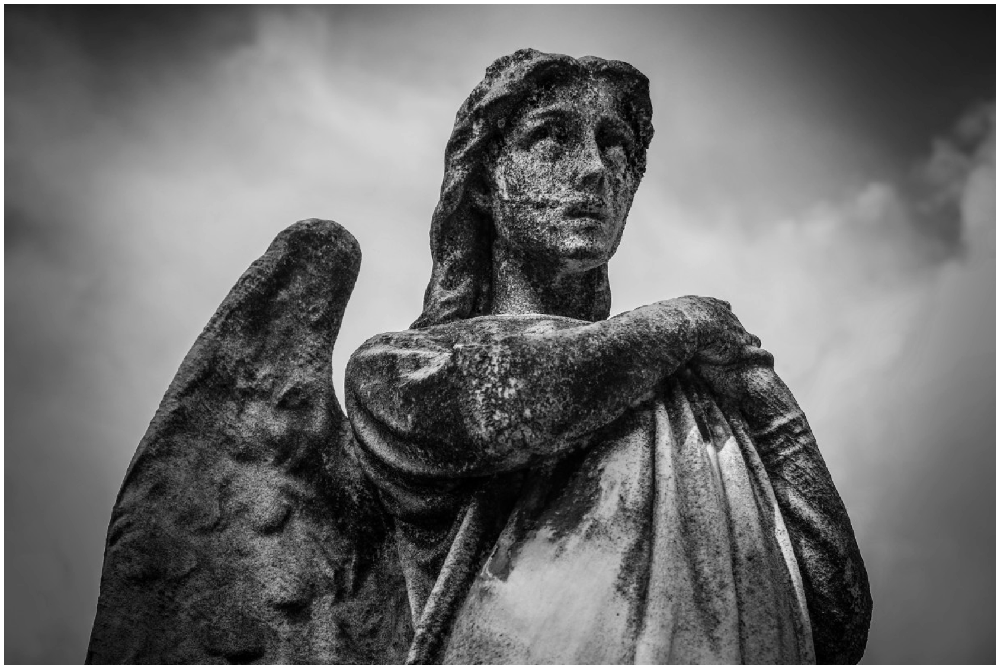

In [650]:
current_image = cv2.imread("test_image.jpg", 0)
show_image(current_image)

### б) Фото с наложенным шумом "соль и перец":

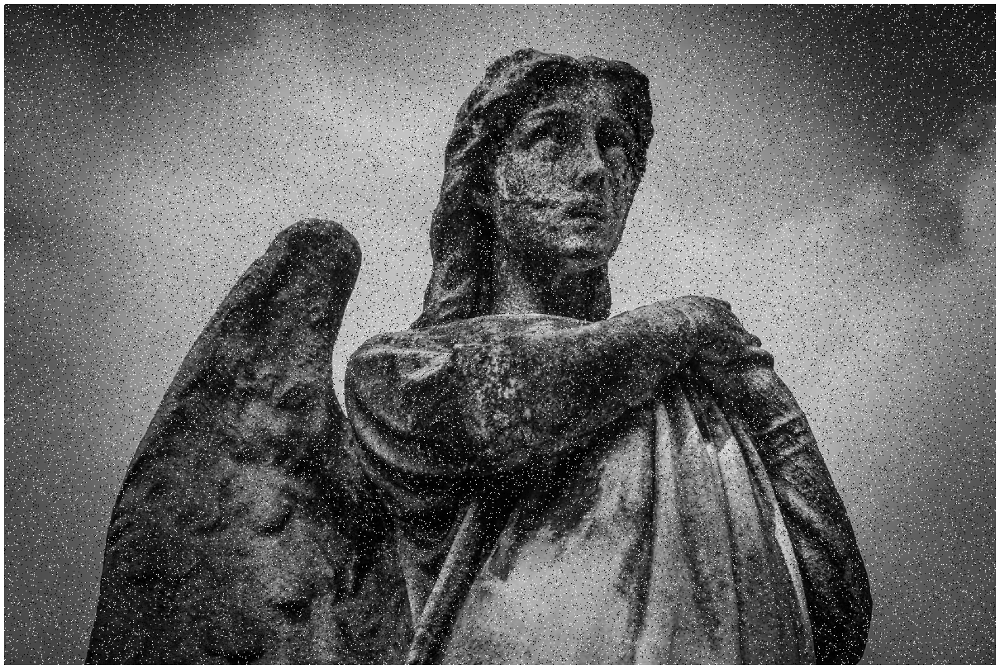

In [651]:
noise_image_first = salt_and_pepper(current_image)
show_image(noise_image_first)

### в) Фото с наложенным импульсным шумом:

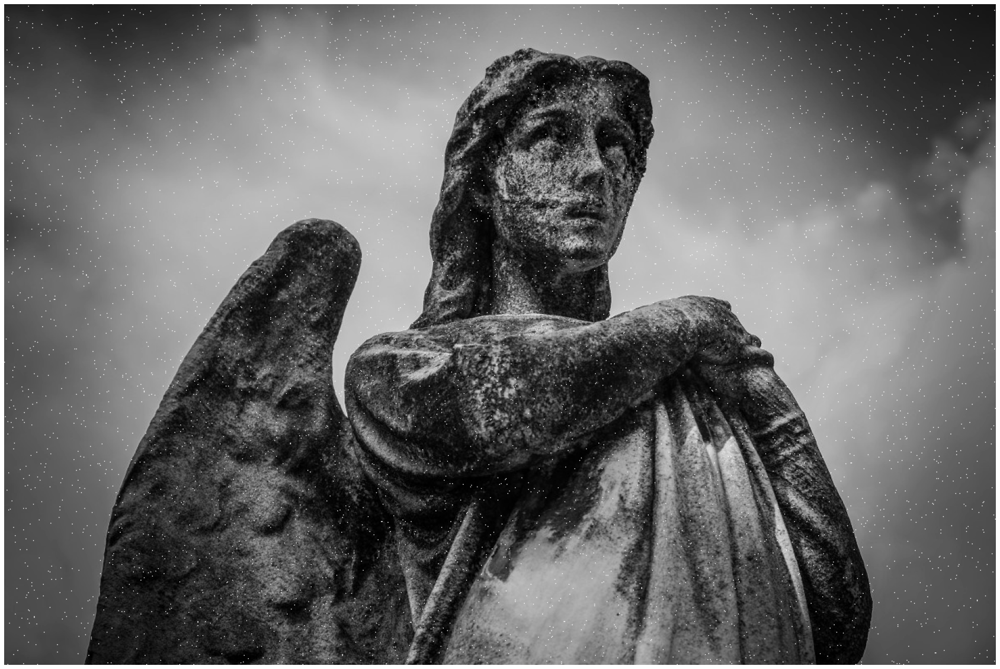

In [652]:
current_image = cv2.imread("test_image.jpg", 0)
noise_image_second = impulse_noise(current_image)
show_image(noise_image_second)

### г) Применение медианного фильтра:
    1. К исходному изображению
    2. К изображению с шумом "соль и перец"
    3. К изображению с импульсным шумом

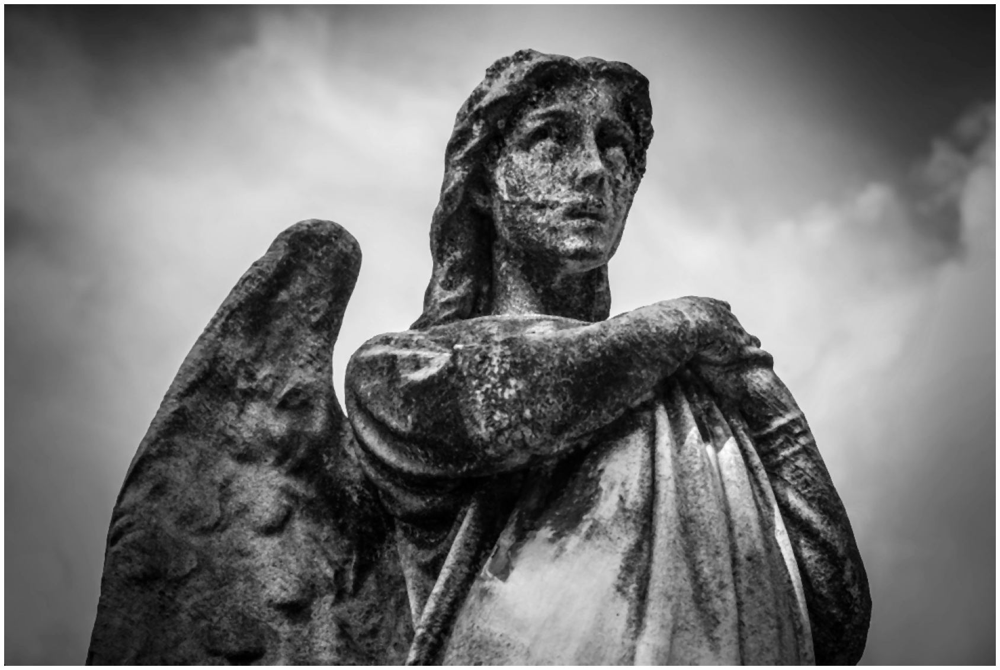

In [654]:
#1
current_image = cv2.imread("test_image.jpg", 0)
fixed_image_first = median_filter(current_image, 3)
show_image(fixed_image_first)

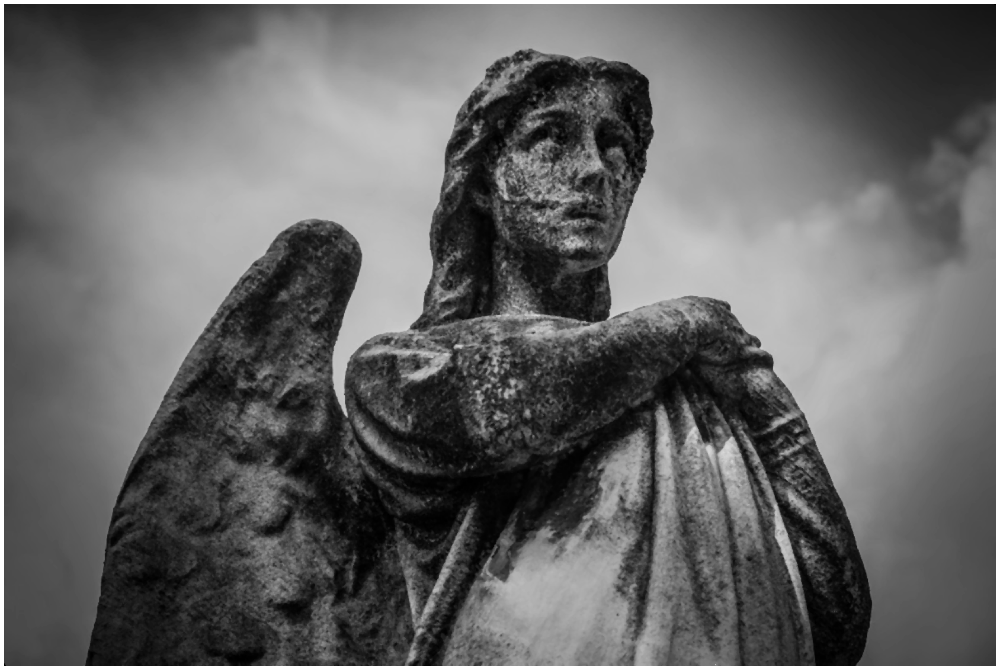

In [655]:
#2
fixed_image_second = median_filter(noise_image_first, 3)
show_image(fixed_image_second)

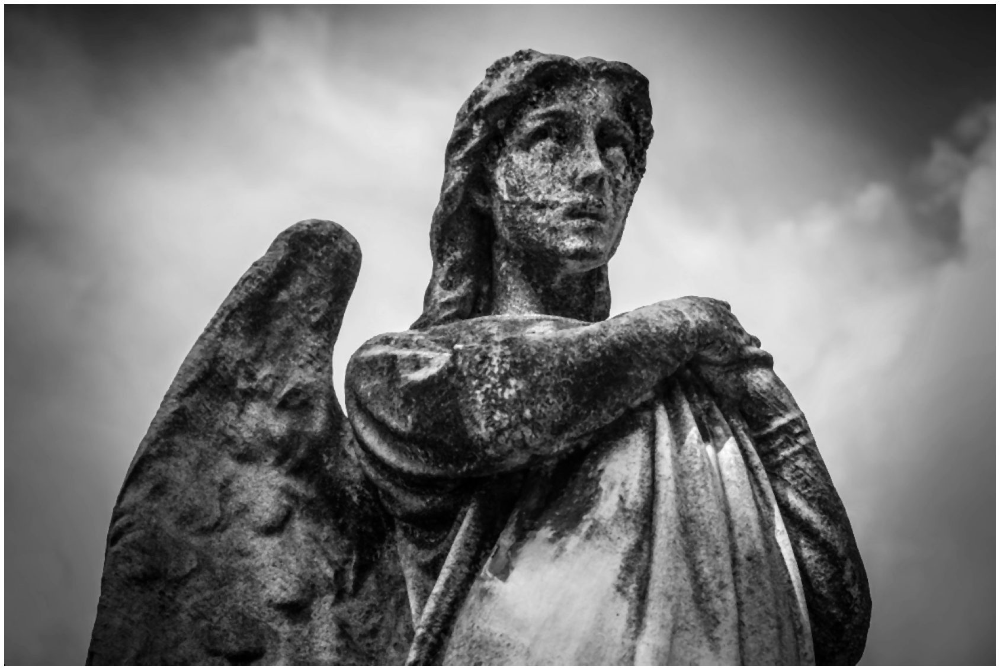

In [656]:
#3
fixed_image_third = median_filter(noise_image_second, 3)
show_image(fixed_image_third)

### д) Применение blur-фильтра к исходному изображению:

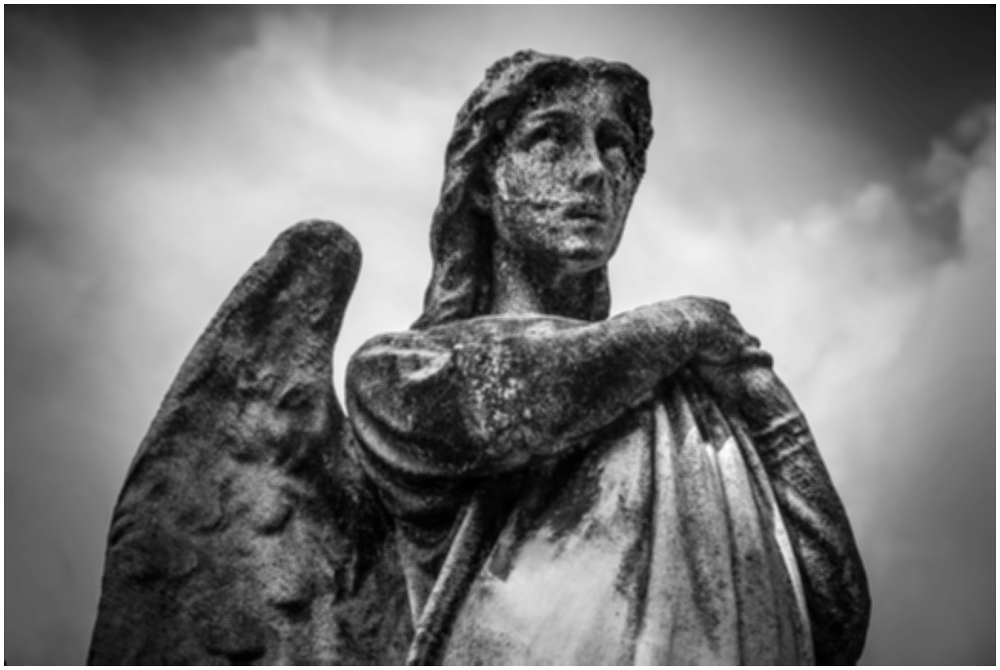

In [657]:
blured_image = blur_filter(current_image, 5)
show_image(blured_image)

### е) Применение фильтра повышения резкости к исходному изображению:

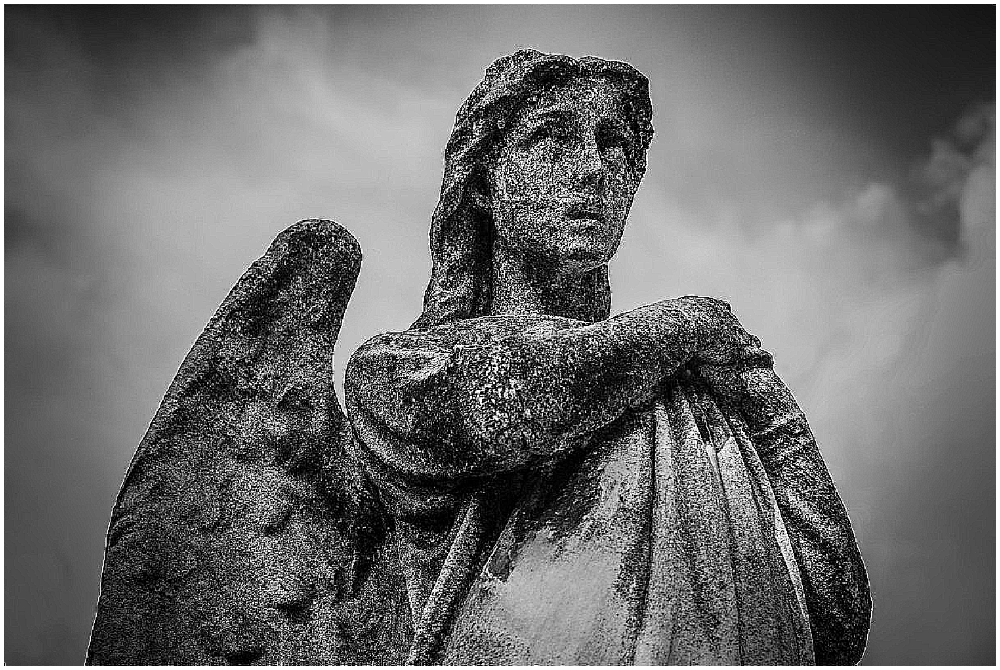

In [658]:
current_image = cv2.imread("test_image.jpg", 0)
sharped_image = sharpness_filter(current_image, 3)
show_image(sharped_image)